In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree  import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor


pd.set_option('display.max_rows',None)
df=pd.read_csv('./yield_df.csv')

In [2]:
df.head()

,Unnamed: 0,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,0,Albania,Maize,1990,36613,1485.0,121.0,16.37
1,1,Albania,Potatoes,1990,66667,1485.0,121.0,16.37
2,2,Albania,"Rice, paddy",1990,23333,1485.0,121.0,16.37
3,3,Albania,Sorghum,1990,12500,1485.0,121.0,16.37
4,4,Albania,Soybeans,1990,7000,1485.0,121.0,16.37


In [3]:
df.tail(10)

,Unnamed: 0,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
28232,28232,Zimbabwe,Sweet potatoes,2012,22222,657.0,3375.53,20.52
28233,28233,Zimbabwe,Wheat,2012,24420,657.0,3375.53,20.52
28234,28234,Zimbabwe,Cassava,2013,46000,657.0,2550.07,19.76
28235,28235,Zimbabwe,Maize,2013,7449,657.0,2550.07,19.76
28236,28236,Zimbabwe,Potatoes,2013,165714,657.0,2550.07,19.76
28237,28237,Zimbabwe,"Rice, paddy",2013,22581,657.0,2550.07,19.76
28238,28238,Zimbabwe,Sorghum,2013,3066,657.0,2550.07,19.76
28239,28239,Zimbabwe,Soybeans,2013,13142,657.0,2550.07,19.76
28240,28240,Zimbabwe,Sweet potatoes,2013,22222,657.0,2550.07,19.76
28241,28241,Zimbabwe,Wheat,2013,22888,657.0,2550.07,19.76


In [4]:
df.drop('Unnamed: 0', axis=1, inplace=True)

In [5]:
df.rename(columns={'Item':'Crop'}, inplace=True)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28242 entries, 0 to 28241
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Area                           28242 non-null  object 
 1   Crop                           28242 non-null  object 
 2   Year                           28242 non-null  int64  
 3   hg/ha_yield                    28242 non-null  int64  
 4   average_rain_fall_mm_per_year  28242 non-null  float64
 5   pesticides_tonnes              28242 non-null  float64
 6   avg_temp                       28242 non-null  float64
dtypes: float64(3), int64(2), object(2)
memory usage: 1.5+ MB


In [7]:
shape=df.shape
print(f'The Data has {shape[0]} rows and {shape[1]} columns')

The Data has 28242 rows and 7 columns


In [8]:
df.describe(include='object').T

,count,unique,top,freq
Area,28242,101,India,4048
Crop,28242,10,Potatoes,4276


In [9]:
df.describe()

,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
count,28242.000000,28242.000000,28242.00000,28242.000000,28242.000000
mean,2001.544296,77053.332094,1149.05598,37076.909344,20.542627
std,7.051905,84956.612897,709.81215,59958.784665,6.312051
min,1990.000000,50.000000,51.00000,0.040000,1.300000
25%,1995.000000,19919.250000,593.00000,1702.000000,16.702500
50%,2001.000000,38295.000000,1083.00000,17529.440000,21.510000
75%,2008.000000,104676.750000,1668.00000,48687.880000,26.000000
max,2013.000000,501412.000000,3240.00000,367778.000000,30.650000


In [10]:
df.isna().sum()

Area                             0
Crop                             0
Year                             0
hg/ha_yield                      0
average_rain_fall_mm_per_year    0
pesticides_tonnes                0
avg_temp                         0
dtype: int64

In [11]:
df.duplicated().sum()

2310

In [12]:
df.drop_duplicates()

,Area,Crop,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,Albania,Maize,1990,36613,1485.0,121.00,16.37
1,Albania,Potatoes,1990,66667,1485.0,121.00,16.37
2,Albania,"Rice, paddy",1990,23333,1485.0,121.00,16.37
3,Albania,Sorghum,1990,12500,1485.0,121.00,16.37
4,Albania,Soybeans,1990,7000,1485.0,121.00,16.37
5,Albania,Wheat,1990,30197,1485.0,121.00,16.37
6,Albania,Maize,1991,29068,1485.0,121.00,15.36
7,Albania,Potatoes,1991,77818,1485.0,121.00,15.36
8,Albania,"Rice, paddy",1991,28538,1485.0,121.00,15.36
9,Albania,Sorghum,1991,6667,1485.0,121.00,15.36


In [13]:
shape=df.shape
print(f'The Data has {shape[0]} rows and {shape[1]} columns')

The Data has 28242 rows and 7 columns


In [14]:
df['Crop'].value_counts()

Crop
Potatoes                4276
Maize                   4121
Wheat                   3857
Rice, paddy             3388
Soybeans                3223
Sorghum                 3039
Sweet potatoes          2890
Cassava                 2045
Yams                     847
Plantains and others     556
Name: count, dtype: int64

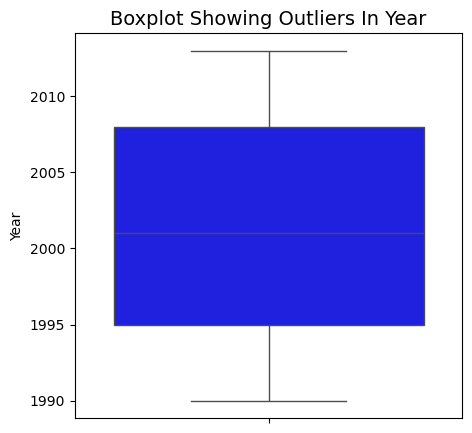

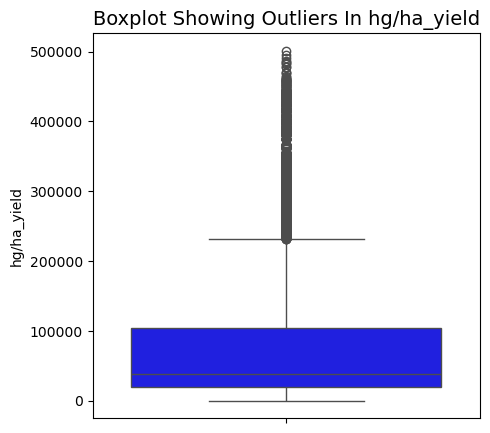

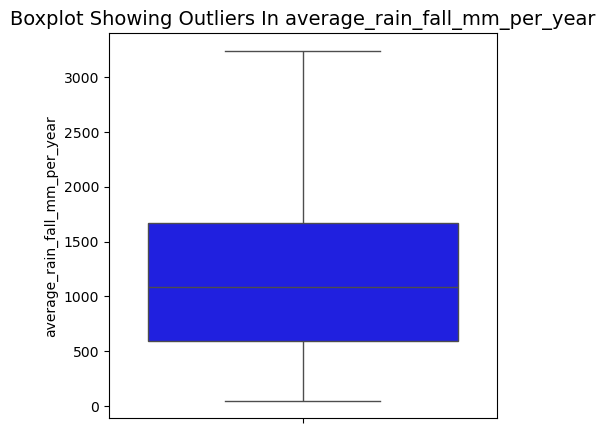

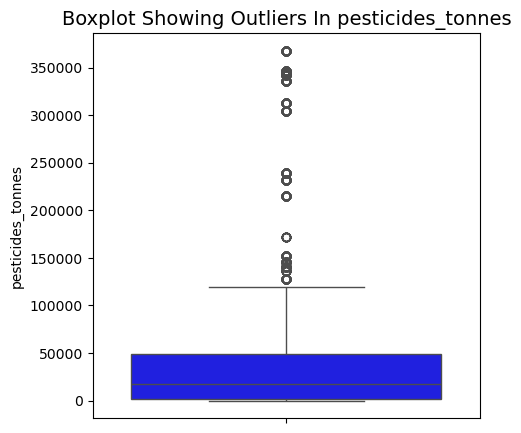

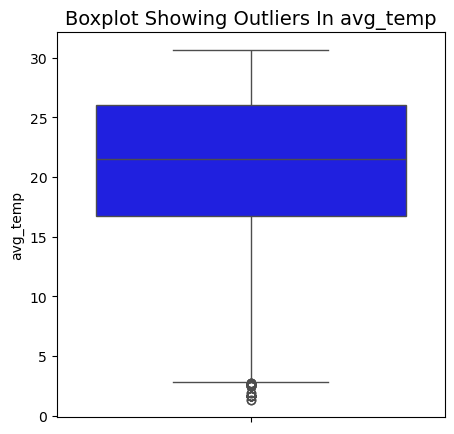

In [15]:
#Get the numerical column in the dataframe
numerical_columns= df.select_dtypes(include=['int64','float64'])
for column in numerical_columns:
    plt.figure(figsize=(5,5))
    sns.boxplot(df[column], color='blue')
    plt.title(f'Boxplot Showing Outliers In {column}', fontsize=14)
    plt.show()

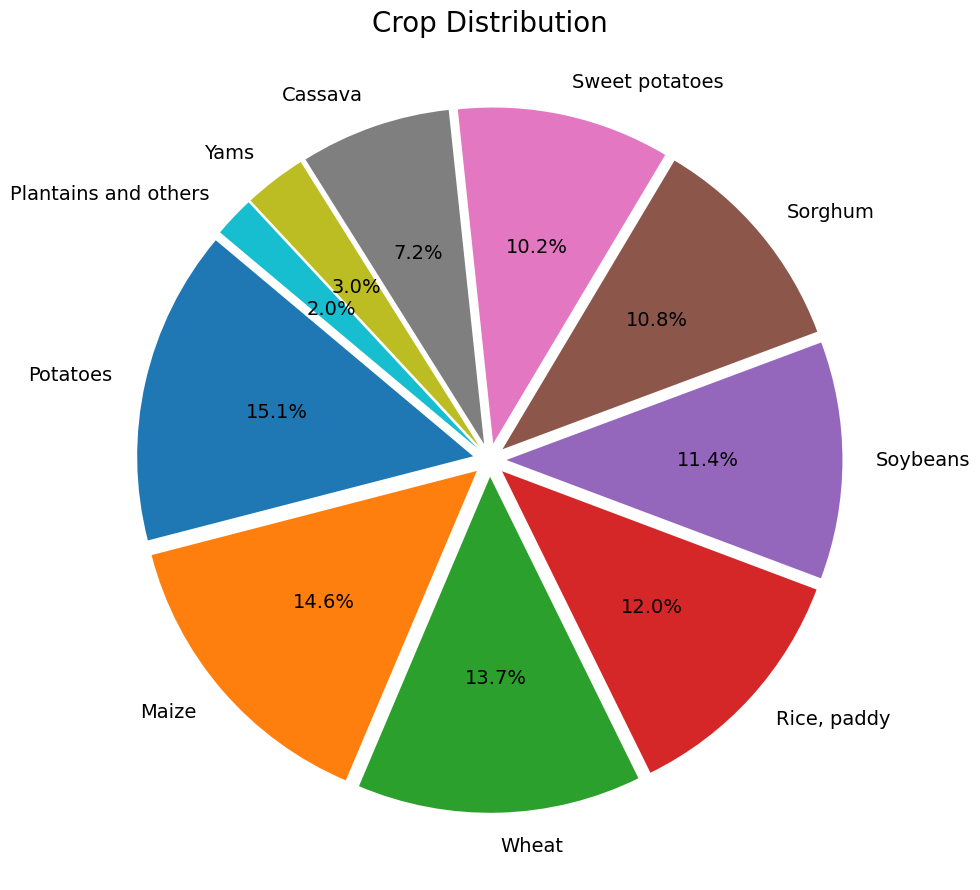

In [16]:
# Count the occurrences of each crop in the 'Crop' column of the DataFrame
crops = df['Crop'].value_counts()
# Create a figure with a fixed size for clarity
plt.figure(figsize=(10,10))
# Slightly "explode" each slice to separate them visually
explode = [0.05] * len(crops)  # Gives each slice a small offset
# Create the pie chart
plt.pie(crops,labels=crops.index,autopct='%1.1f%%',
        startangle=140,explode=explode,textprops={'fontsize': 14})
# Add a descriptive title with larger font
plt.title("Crop Distribution", fontsize=20)
# Adjust layout to ensure nothing is clipped
plt.tight_layout()
# Display the chart
plt.show()

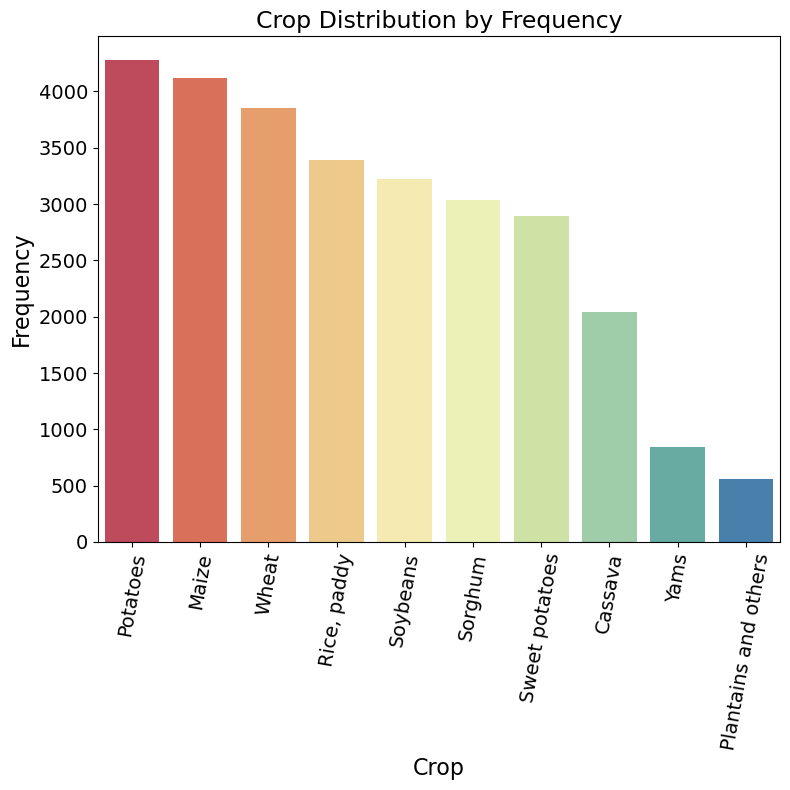

In [17]:
# Count the occurrences of each crop in the DataFrame
crops = df['Crop'].value_counts()

# Create a new DataFrame from the Series for seaborn compatibility
crop_df = crops.reset_index()
crop_df.columns = ['Crop', 'Frequency']

# Create a figure of size 8x8 inches for better visibility
plt.figure(figsize=(8, 8))

# Plot a vertical bar chart using seaborn
sns.barplot(x='Crop',y='Frequency',data=crop_df,palette='Spectral',hue=crops.index)

# Rotate x-axis labels by 80 degrees and increase font size
plt.xticks(rotation=80, fontsize=14)

# Set font size of y-axis tick labels
plt.yticks(fontsize=14)

# Set axis labels with larger fonts
plt.xlabel('Crop', fontsize=16)
plt.ylabel('Frequency', fontsize=16)

# Set chart title with increased font size
plt.title('Crop Distribution by Frequency', fontsize=17)

# Adjust layout to prevent overlap or clipping
plt.tight_layout()

# Display the plot
plt.show()

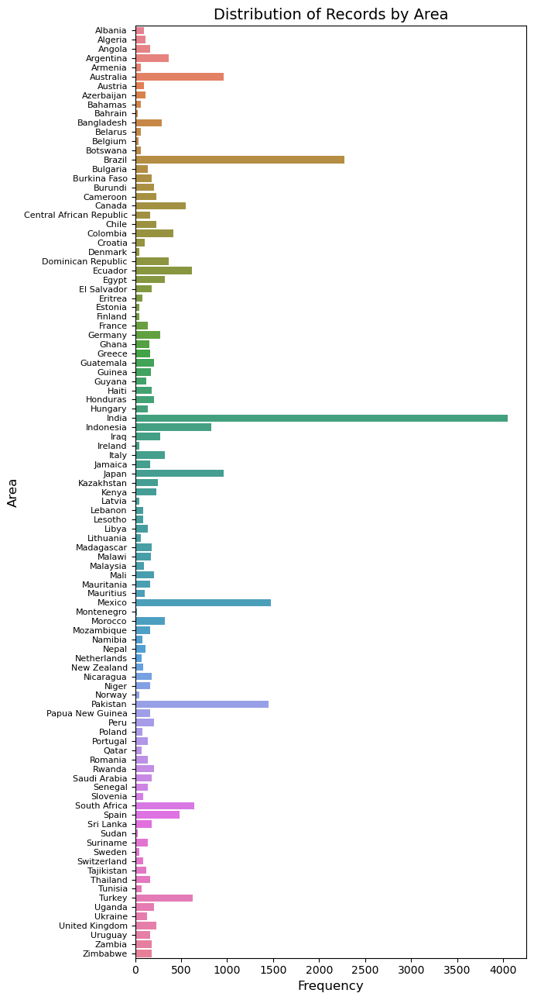

In [18]:
# Set figure size: wide vertically for long lists of areas
plt.figure(figsize=(7, 13))

# Create a countplot showing the number of occurrences for each 'Area'
sns.countplot(data=df,y='Area',palette='husl',hue='Area')

# Adjust y-axis tick font size for better readability
plt.yticks(fontsize=8)

# Add labels and title for clarity
plt.xlabel('Frequency', fontsize=12)
plt.ylabel('Area', fontsize=12)
plt.title('Distribution of Records by Area', fontsize=14)

# Adjust layout to prevent overlapping
plt.tight_layout()

# Display the plot
plt.show()

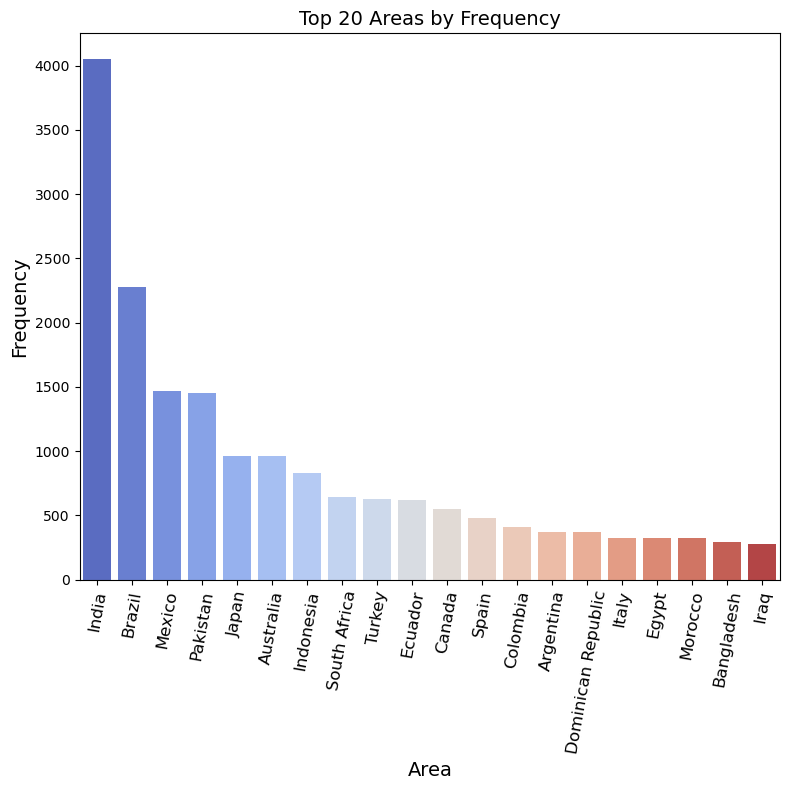

In [19]:
# Get top 20 most frequent Areas
area_counts = df['Area'].value_counts().head(20)
# Create a new figure
plt.figure(figsize=(8, 8))
# Plot a bar chart of the top 20 Areas
sns.barplot(x=area_counts.index, y=area_counts.values, palette='coolwarm',hue=area_counts.index)
# Rotate x-axis labels and set font size for readability
plt.xticks(rotation=80, fontsize=12)
# Set axis labels and title
plt.xlabel('Area', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('Top 20 Areas by Frequency', fontsize=14)
# Optimize layout
plt.tight_layout()
# Show the plot
plt.show()

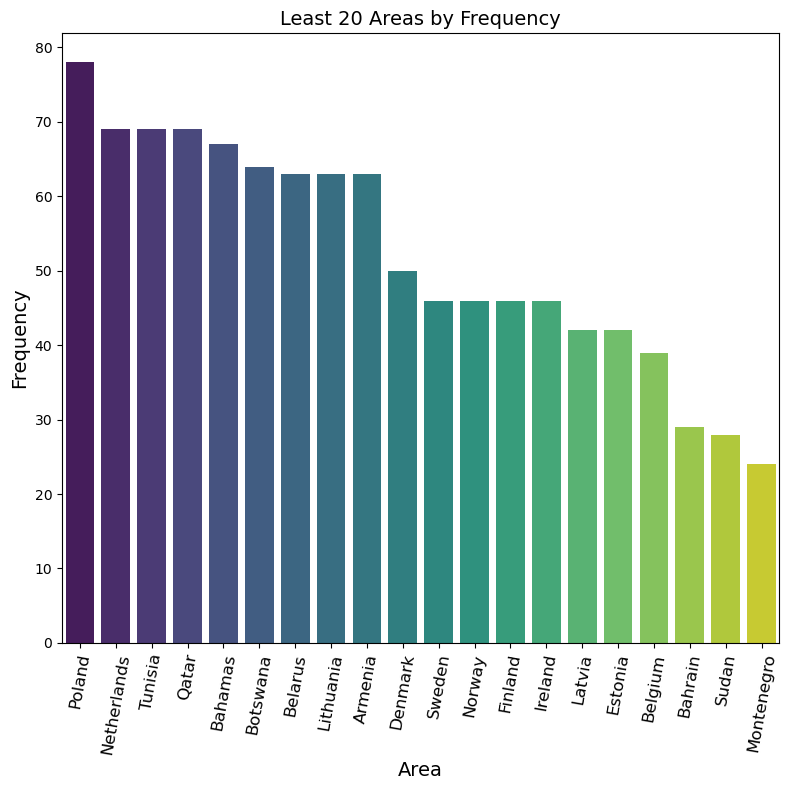

In [20]:
# Get top 20 most frequent Areas
area_counts = df['Area'].value_counts().tail(20)
# Create a new figure
plt.figure(figsize=(8, 8))
# Plot a bar chart of the top 20 Areas
sns.barplot(x=area_counts.index, y=area_counts.values, palette='viridis',hue=area_counts.index)
# Rotate x-axis labels and set font size for readability
plt.xticks(rotation=80, fontsize=12)
# Set axis labels and title
plt.xlabel('Area', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('Least 20 Areas by Frequency', fontsize=14)
# Optimize layout
plt.tight_layout()
# Show the plot
plt.show()

In [21]:
# %pip install ipywidgets

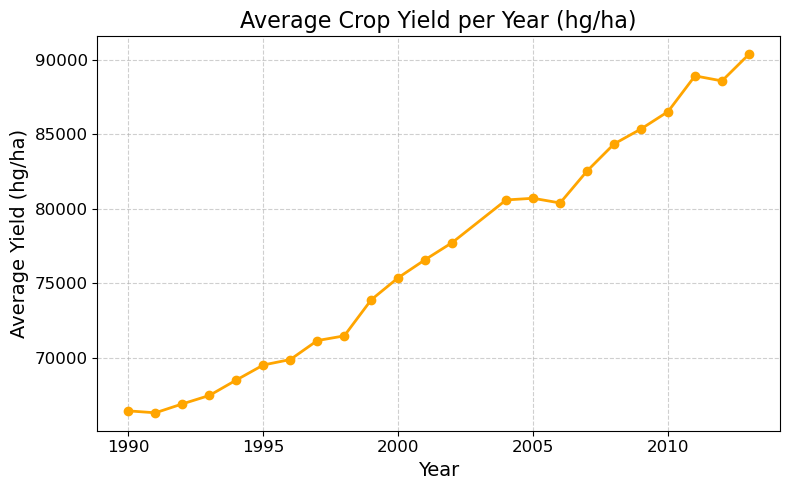

In [22]:
# Group data by 'Year' and calculate the mean of 'hg/ha_yield'
yearly_yield = df.groupby('Year')['hg/ha_yield'].mean()

# Create a line plot of average yield over time
plt.figure(figsize=(8, 5))
yearly_yield.plot(color='orange', linewidth=2, marker='o')

# Set chart title and axis labels
plt.title('Average Crop Yield per Year (hg/ha)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average Yield (hg/ha)', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
# Add grid for better visual guidance
plt.grid(True, linestyle='--', alpha=0.6)

# Optimize layout
plt.tight_layout()

# Display the plot
plt.show()


In [23]:
# import ipywidgets as widgets
# from IPython.display import display

# # Create dropdowns
# area_dropdown = widgets.Dropdown(options=df['Area'].unique(), description='Area:')
# crop_dropdown = widgets.Dropdown(options=df['Crop'].unique(), description='Crop:')

# # Function to plot data
# def plot_data(area, crop):
#     plt.figure(figsize=(10,6))
#     df1 = df[(df['Area'] == area) & (df['Crop'] == crop)]
#     plt.plot(df1['Year'], df1['hg/ha_yield'])
#     plt.title(f'hg/ha_yield over the years for {crop} in {area}')
#     plt.xlabel('Year')
#     plt.ylabel('hg/ha_yield')
#     plt.grid(True)
#     plt.show()

# # Use interactive function to automatically update the plot
# widgets.interactive(plot_data, area=area_dropdown, crop=item_dropdown)

In [24]:
df.groupby('Area')['hg/ha_yield'].mean()

Area
Albania                      57692.282828
Algeria                      58872.491228
Angola                       34893.676829
Argentina                    89304.434783
Armenia                      71811.111111
Australia                   112951.409938
Austria                     113044.354167
Azerbaijan                   39727.413793
Bahamas                      65443.537313
Bahrain                     153237.551724
Bangladesh                   52518.088435
Belarus                      74679.555556
Belgium                     216468.461538
Botswana                      7353.921875
Brazil                       73583.797101
Bulgaria                     45384.601449
Burkina Faso                 33061.614130
Burundi                      33966.888889
Cameroon                     46599.491304
Canada                       62874.858696
Central African Republic     26432.465839
Chile                        89396.582609
Colombia                     65041.396135
Croatia                      

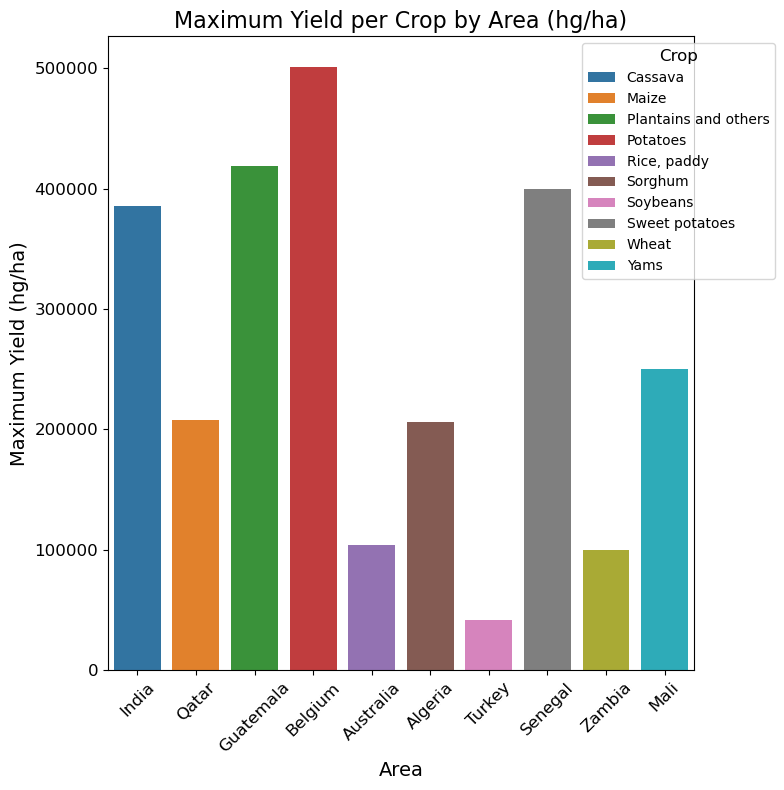

In [25]:
# Group by Crop and get the row with the highest yield per crop
best_crop = df.loc[df.groupby('Crop')['hg/ha_yield'].idxmax()][['Crop', 'Area', 'hg/ha_yield']]

# Create a bar plot of maximum yield per crop
plt.figure(figsize=(8, 8))
sns.barplot(data=best_crop,x='Area', y='hg/ha_yield', hue='Crop')

# Set the title and axis labels
plt.title('Maximum Yield per Crop by Area (hg/ha)', fontsize=16)
plt.xlabel('Area', fontsize=14)
plt.ylabel('Maximum Yield (hg/ha)', fontsize=14)

# Adjust tick label font sizes
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)
# Resize and position the hue legend
plt.legend(title='Crop', title_fontsize=12, fontsize=10, loc='upper right', bbox_to_anchor=(1.15, 1))

# Tidy up layout
plt.tight_layout()

# Display the plot
plt.show()

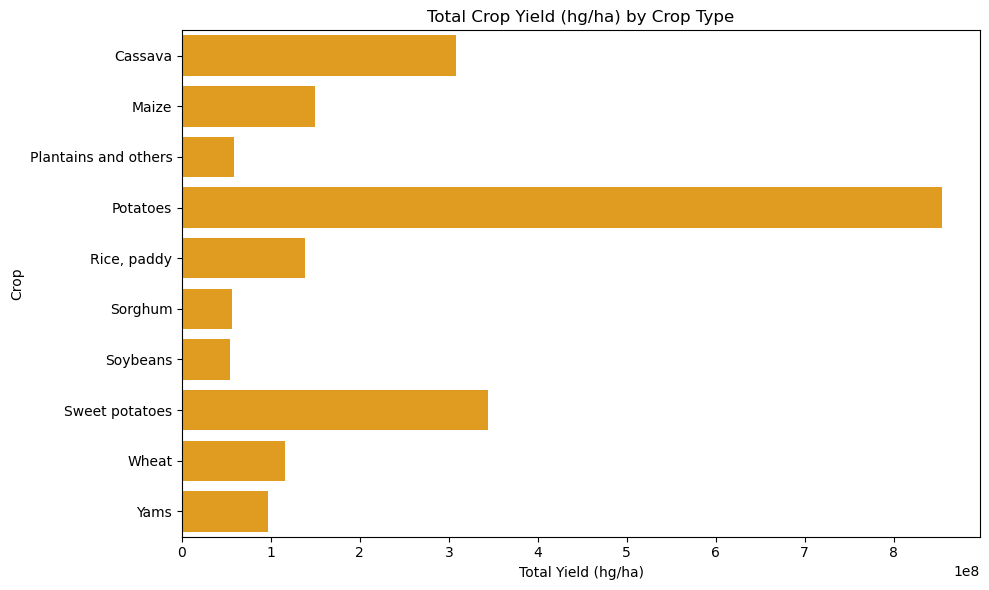

In [26]:
# Group by crop and calculate **total** yield
yield_per_crop = df.groupby('Crop')['hg/ha_yield'].sum()
# Plot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x=yield_per_crop.values, y=yield_per_crop.index, color='orange')
plt.title('Total Crop Yield (hg/ha) by Crop Type')
plt.xlabel('Total Yield (hg/ha)')
plt.ylabel('Crop')
plt.tight_layout()
plt.show()

Country/Area with the best average yield:
Area           United Kingdom
hg/ha_yield     240956.478261
Name: 97, dtype: object


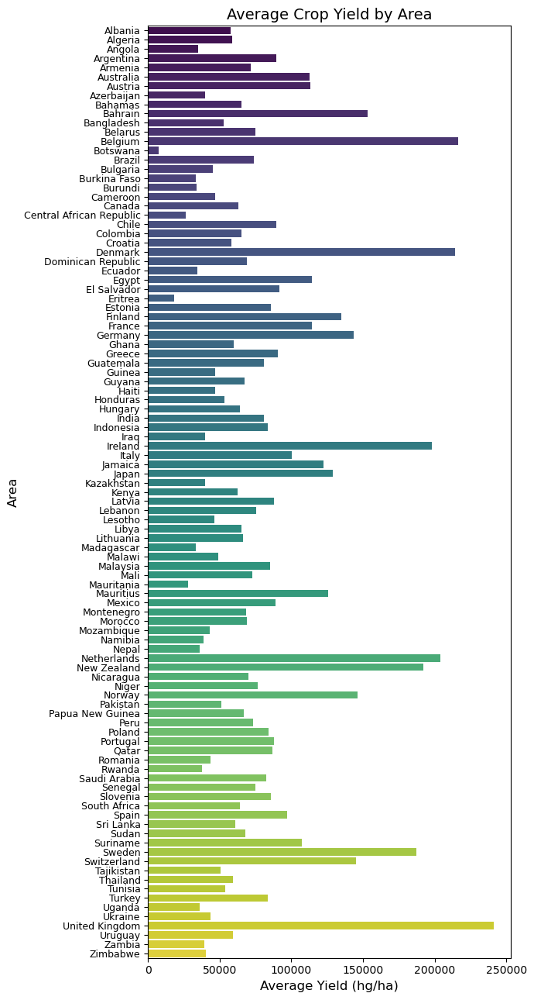

In [27]:
# Group by Area and compute average yield
Area_sum = df.groupby('Area')['hg/ha_yield'].mean().reset_index()
Area_sum.columns = ['Area', 'hg/ha_yield']

# Find the country/area with the best average yield
best_area = Area_sum.loc[Area_sum['hg/ha_yield'].idxmax()]
print("Country/Area with the best average yield:")
print(best_area)

# Plot average yield per area
plt.figure(figsize=(7, 13))
sns.barplot(data=Area_sum, x='hg/ha_yield', y='Area', hue='Area', palette="viridis")

plt.yticks(fontsize=9)
plt.xlabel('Average Yield (hg/ha)', fontsize=12)
plt.ylabel('Area', fontsize=12)
plt.title('Average Crop Yield by Area', fontsize=14)

plt.tight_layout()
plt.show()

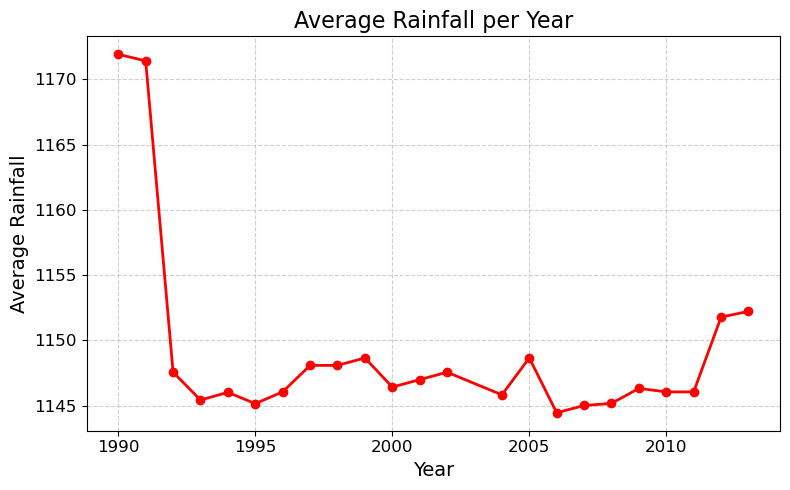

In [28]:
# Group data by 'Year' and calculate the mean of 'hg/ha_yield'
yearly_rainfall = df.groupby('Year')['average_rain_fall_mm_per_year'].mean()

# Create a line plot of average yield over time
plt.figure(figsize=(8, 5))
yearly_rainfall.plot(color='red', linewidth=2, marker='o')

# Set chart title and axis labels
plt.title('Average Rainfall per Year', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average Rainfall', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
# Add grid for better visual guidance
plt.grid(True, linestyle='--', alpha=0.6)

# Optimize layout
plt.tight_layout()

# Display the plot
plt.show()

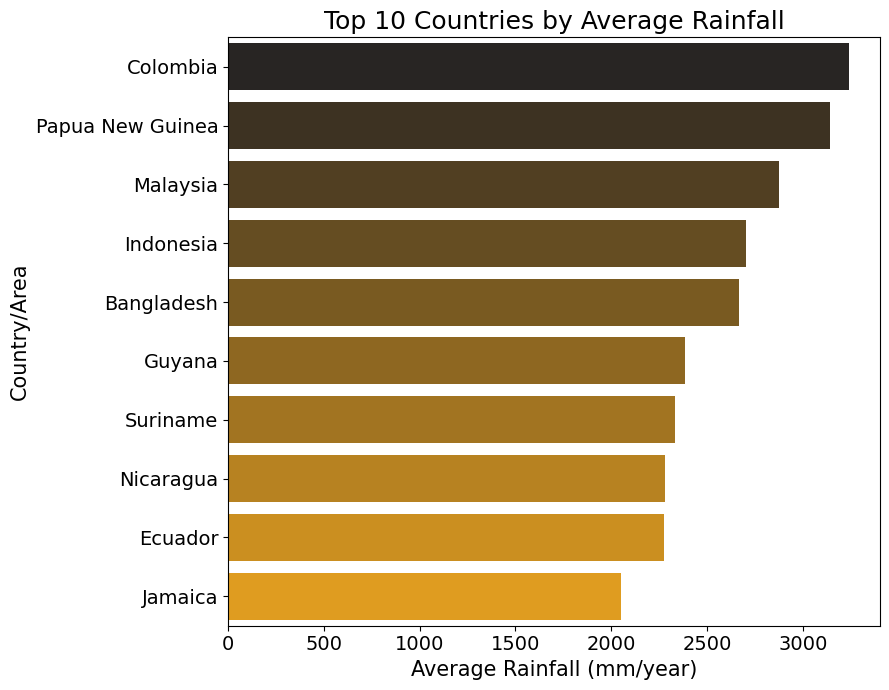

In [29]:
# Group by Area and calculate average rainfall
avg_rainfall = df.groupby('Area')['average_rain_fall_mm_per_year'].mean()

# Sort in descending order and get the top 10
top10_avg_rainfall = avg_rainfall.sort_values(ascending=False).head(10)

# Convert to DataFrame for better handling
top10_df = top10_avg_rainfall.reset_index()
top10_df.columns = ['Area', 'Average_Rainfall']

# Plot
plt.figure(figsize=(9,7))
sns.barplot(data=top10_df, x='Average_Rainfall', y='Area', palette='dark:orange', hue='Area')

# Chart styling
plt.title('Top 10 Countries by Average Rainfall', fontsize=18)
plt.xlabel('Average Rainfall (mm/year)', fontsize=15)
plt.ylabel('Country/Area', fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()

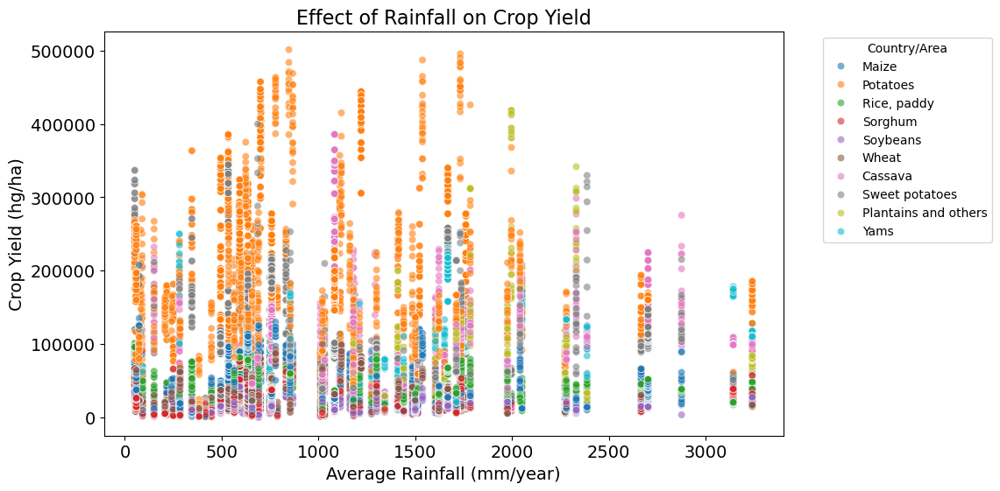

In [30]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='average_rain_fall_mm_per_year', y='hg/ha_yield', hue='Crop', alpha=0.6)

plt.title('Effect of Rainfall on Crop Yield', fontsize=16)
plt.xlabel('Average Rainfall (mm/year)', fontsize=14)
plt.ylabel('Crop Yield (hg/ha)', fontsize=14)
plt.legend(title='Country/Area', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
# plt.tight_layout()
plt.show()

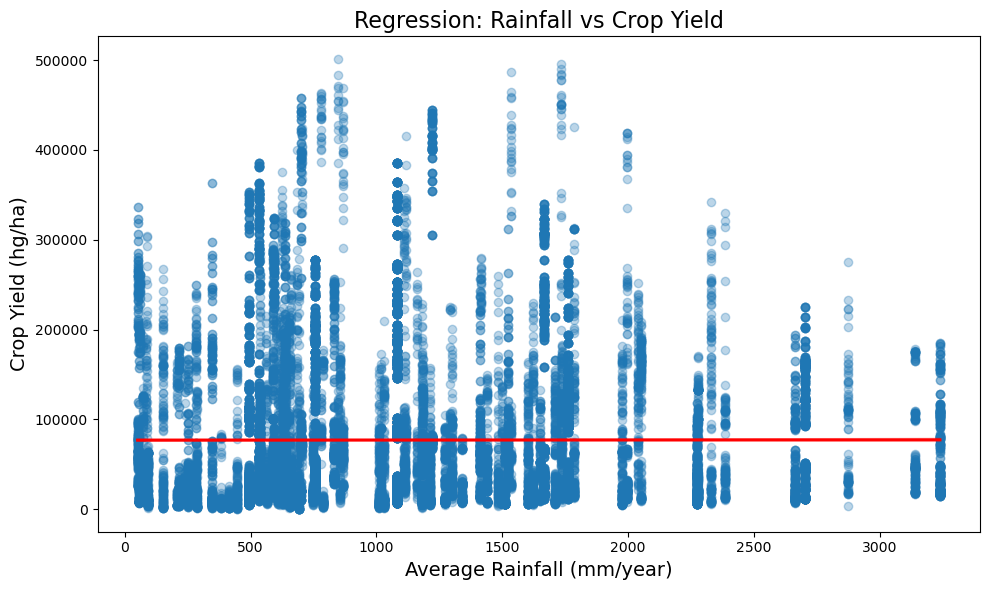

In [31]:
plt.figure(figsize=(10, 6))
sns.regplot(data=df, x='average_rain_fall_mm_per_year', y='hg/ha_yield', scatter_kws={'alpha':0.3}, line_kws={'color':'red'})

plt.title('Regression: Rainfall vs Crop Yield', fontsize=16)
plt.xlabel('Average Rainfall (mm/year)', fontsize=14)
plt.ylabel('Crop Yield (hg/ha)', fontsize=14)
plt.tight_layout()
plt.show()

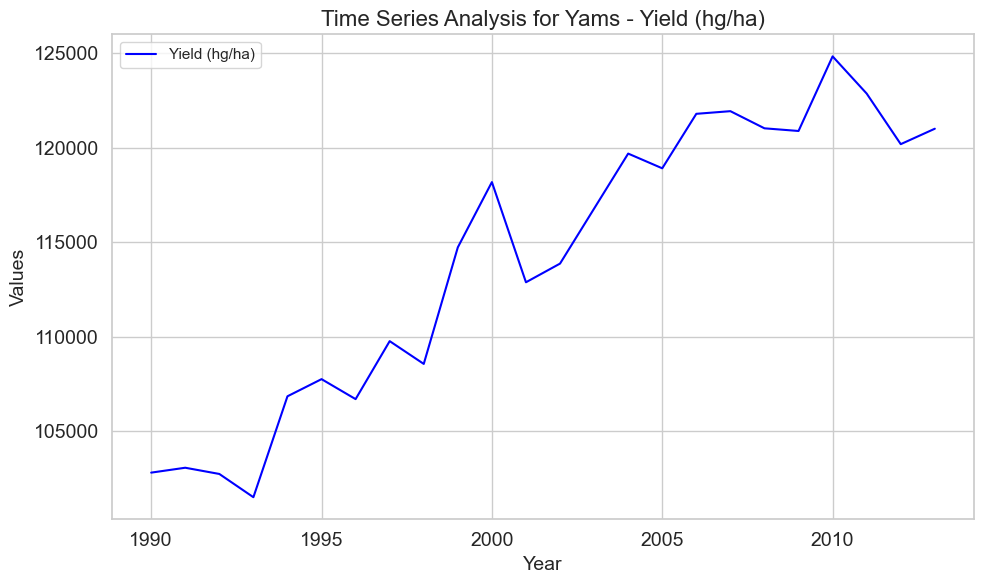

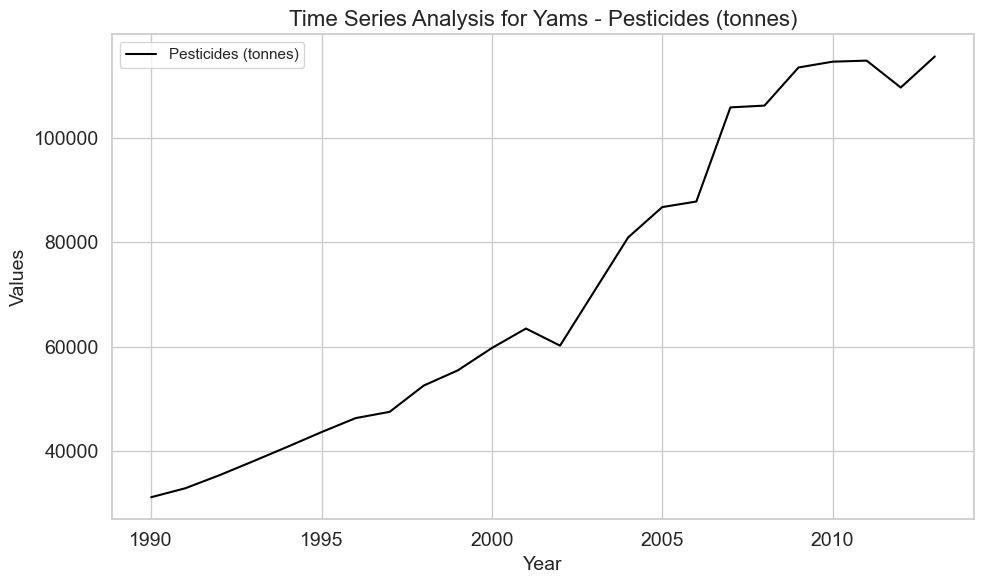

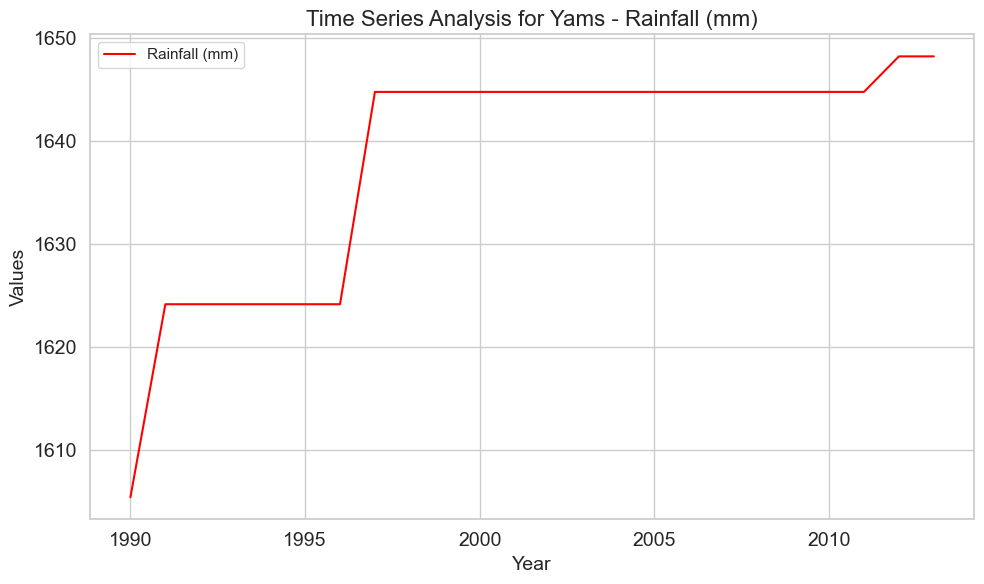

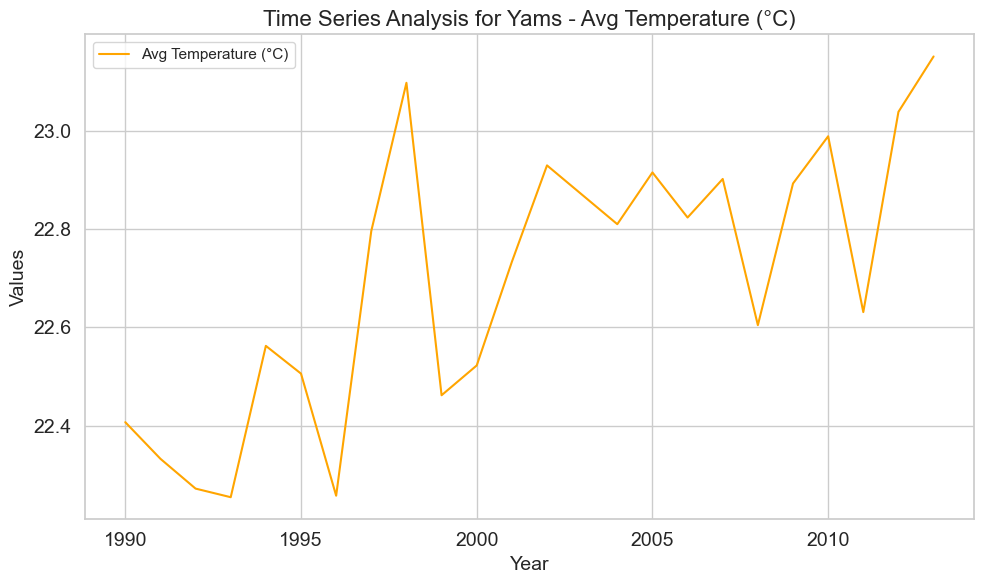

In [110]:
def plot_crop_trends(df, selected_crop):

    # Filter the DataFrame by the selected crop
    df2 = df[df['Crop'] == selected_crop]

    # Dictionary of metrics to plot: column -> (label, color)
    metrics = {'hg/ha_yield': ('Yield (hg/ha)', 'blue'),
        'pesticides_tonnes': ('Pesticides (tonnes)', 'black'),
        'average_rain_fall_mm_per_year': ('Rainfall (mm)', 'red'),
        'avg_temp': ('Avg Temperature (°C)', 'orange')}

    # Loop through each metric and create a time series plot
    for col, (label, color) in metrics.items():
        fig, ax = plt.subplots(figsize=(10, 6))

        # Plot mean values grouped by year
        df2.groupby('Year')[col].mean().plot(ax=ax, color=color, label=label)

        # Add plot formatting
        ax.set_title(f"Time Series Analysis for {selected_crop} - {label}", fontsize=16)
        ax.set_xlabel("Year", fontsize=14)
        ax.set_ylabel("Values", fontsize=14)
        for label in ax.get_xticklabels():
            label.set_fontsize(14)
        for label in ax.get_yticklabels():
            label.set_fontsize(14)
        ax.legend()
        ax.grid(True)
        # Display the plot
        plt.tight_layout()
        plt.show()
        
plot_crop_trends(df, 'Yams')

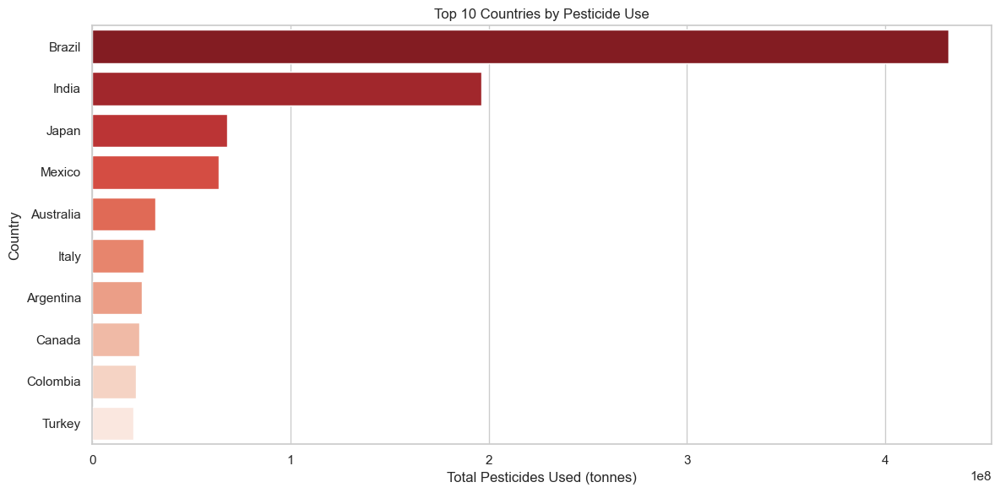

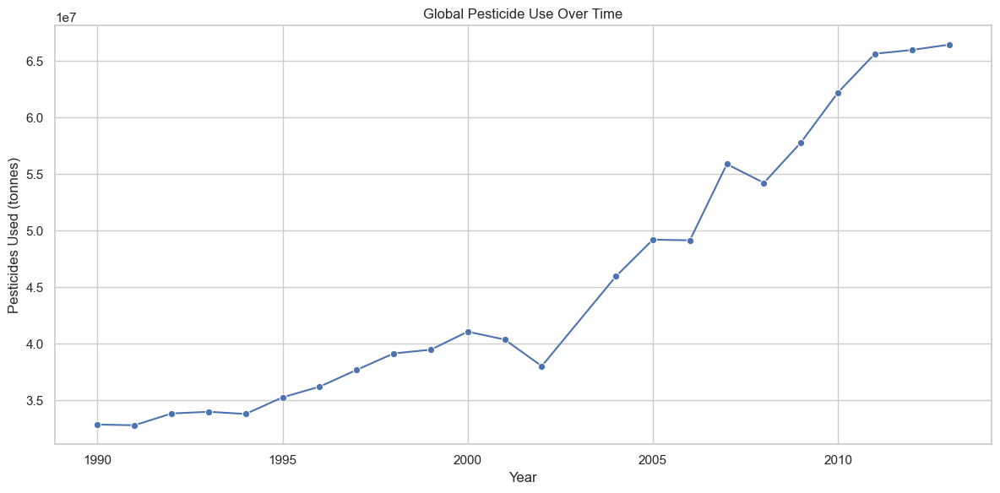

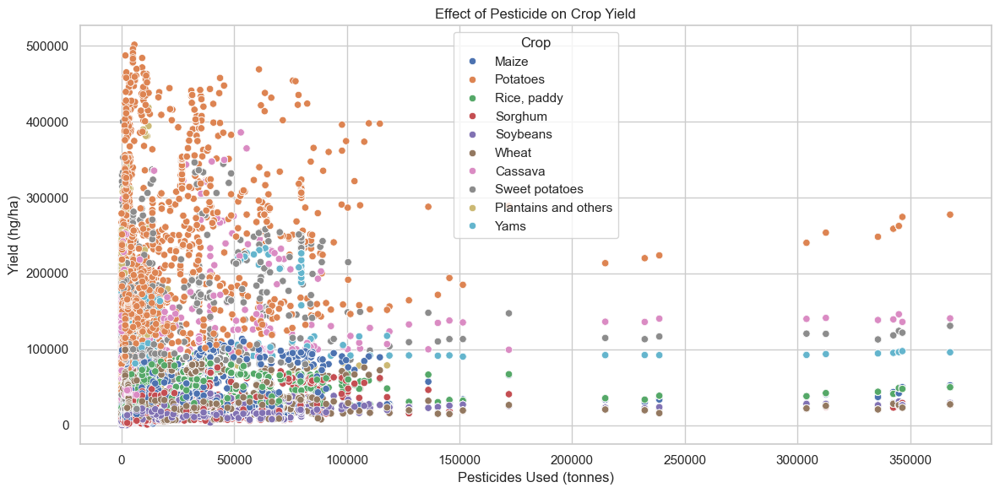

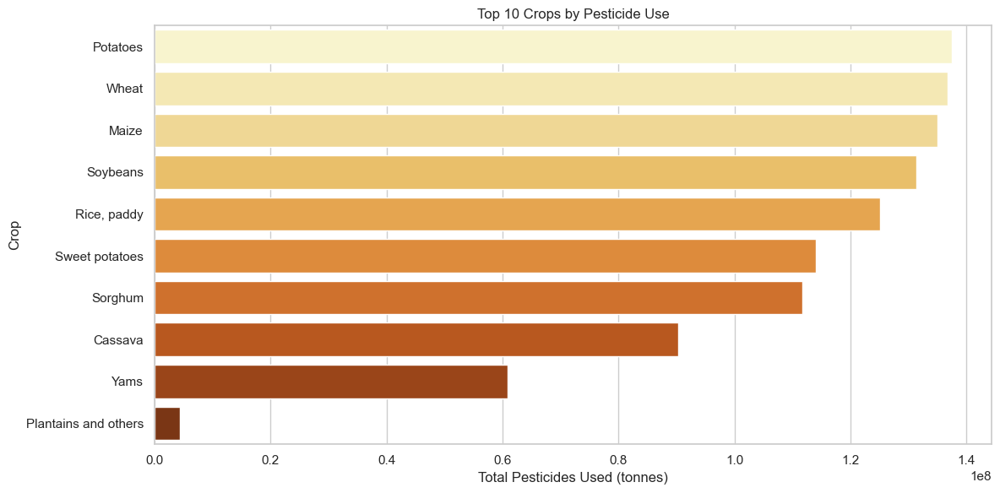

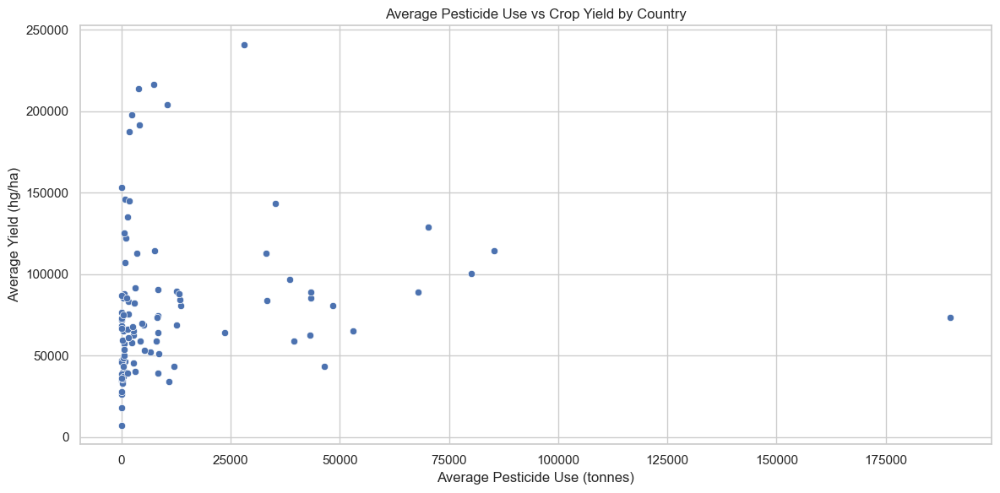

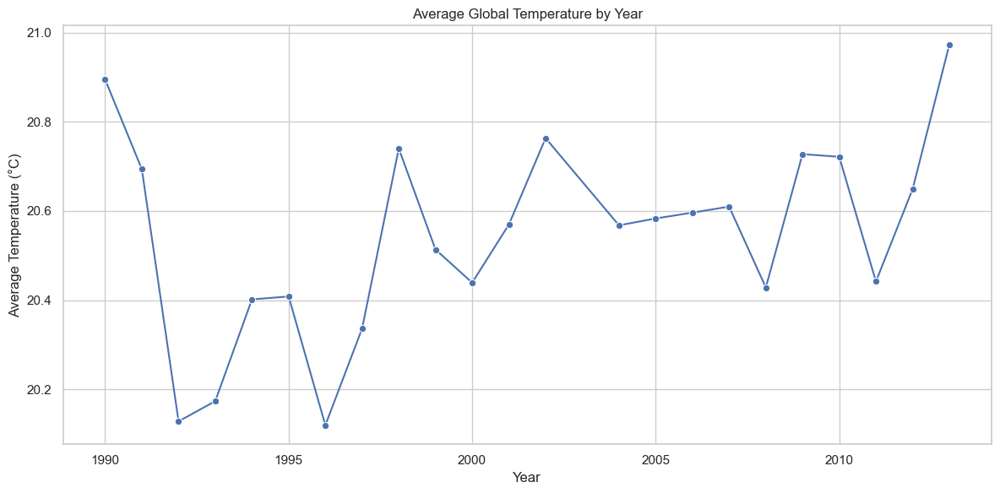

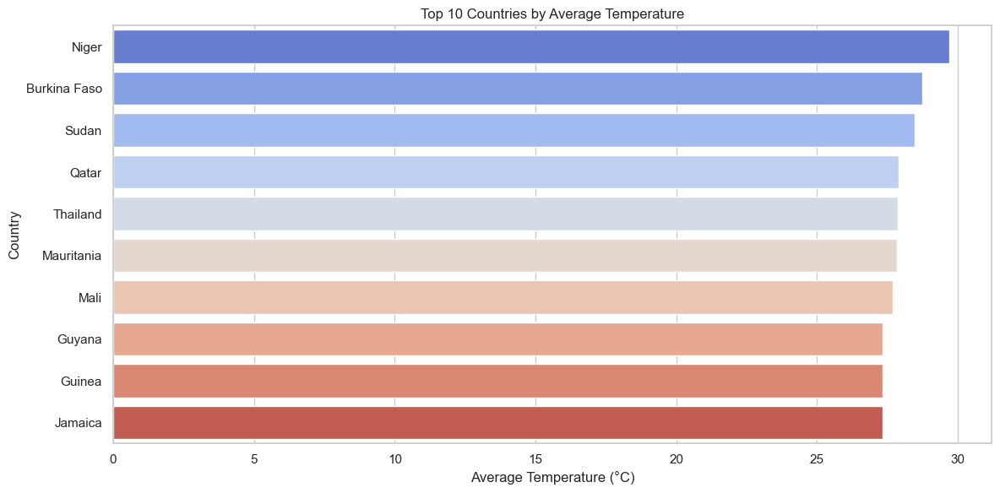

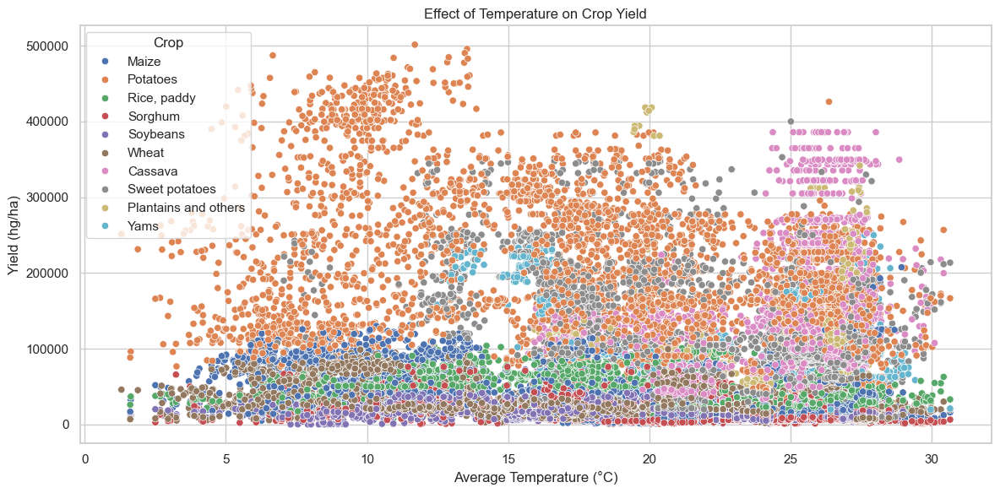

The country with the highest average temperature is Niger with 29.72°C.


In [100]:
# Set style
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

# # 1. Country using the most pesticide
# pesticide_by_country = df.groupby('Area')['pesticides_tonnes'].sum().sort_values(ascending=False).head(10)
# sns.barplot(x=pesticide_by_country.values, y=pesticide_by_country.index, palette="Reds_r", hue= pesticide_by_country.index )
# plt.title('Top 10 Countries by Pesticide Use')
# plt.xlabel('Total Pesticides Used (tonnes)')
# plt.ylabel('Country')
# plt.tight_layout()
# plt.show()

# # 2. Line graph showing global pesticide usage over time
# pesticide_by_year = df.groupby('Year')['pesticides_tonnes'].sum()
# sns.lineplot(x=pesticide_by_year.index, y=pesticide_by_year.values, marker='o')
# plt.title('Global Pesticide Use Over Time')
# plt.xlabel('Year')
# plt.ylabel('Pesticides Used (tonnes)')
# plt.tight_layout()
# plt.show()

# # 3. Effect of pesticide on crop yield
# sns.scatterplot(data=df, x='pesticides_tonnes', y='hg/ha_yield', hue='Crop')
# plt.title('Effect of Pesticide on Crop Yield')
# plt.xlabel('Pesticides Used (tonnes)')
# plt.ylabel('Yield (hg/ha)')
# plt.tight_layout()
# plt.show()

# 4. Crops with most pesticide used
pesticide_by_crop = df.groupby('Crop')['pesticides_tonnes'].sum().sort_values(ascending=False).head(10)
sns.barplot(x=pesticide_by_crop.values, y=pesticide_by_crop.index, palette="YlOrBr", hue=pesticide_by_crop.index)
plt.title('Top 10 Crops by Pesticide Use')
plt.xlabel('Total Pesticides Used (tonnes)')
plt.ylabel('Crop')
plt.tight_layout()
plt.show()

# 5. Scatterplot showing pesticide vs yield by country
avg_data_country = df.groupby('Area')[['pesticides_tonnes', 'hg/ha_yield']].mean().dropna()
sns.scatterplot(data=avg_data_country, x='pesticides_tonnes', y='hg/ha_yield')
plt.title('Average Pesticide Use vs Crop Yield by Country')
plt.xlabel('Average Pesticide Use (tonnes)')
plt.ylabel('Average Yield (hg/ha)')
plt.tight_layout()
plt.show()

# 6. Average temperature by year
avg_temp_year = df.groupby('Year')['avg_temp'].mean()
sns.lineplot(x=avg_temp_year.index, y=avg_temp_year.values, marker='o')
plt.title('Average Global Temperature by Year')
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')
plt.tight_layout()
plt.show()

# 7. Average temperature by country (Top 10 warmest)
avg_temp_country = df.groupby('Area')['avg_temp'].mean().sort_values(ascending=False).head(10)
sns.barplot(x=avg_temp_country.values, y=avg_temp_country.index, palette="coolwarm", hue=avg_temp_country.index)
plt.title('Top 10 Countries by Average Temperature')
plt.xlabel('Average Temperature (°C)')
plt.ylabel('Country')
plt.tight_layout()
plt.show()

# 8. Effect of temperature on crop yield
sns.scatterplot(data=df, x='avg_temp', y='hg/ha_yield', hue='Crop')
plt.title('Effect of Temperature on Crop Yield')
plt.xlabel('Average Temperature (°C)')
plt.ylabel('Yield (hg/ha)')
plt.tight_layout()
plt.show()

# 9. Country with highest average temperature
hottest_country = avg_temp_country.idxmax()
max_temp = avg_temp_country.max()
print(f"The country with the highest average temperature is {hottest_country} with {max_temp:.2f}°C.")


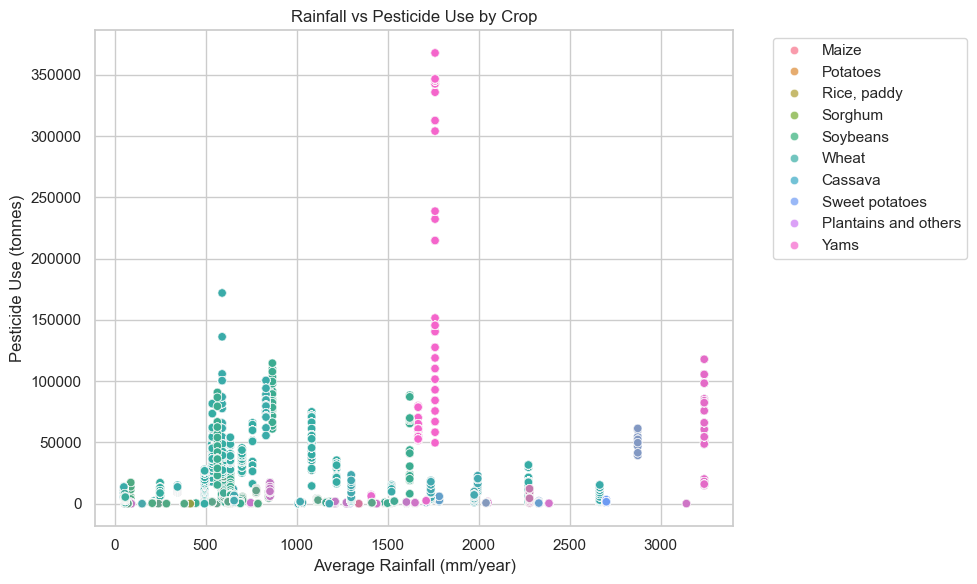

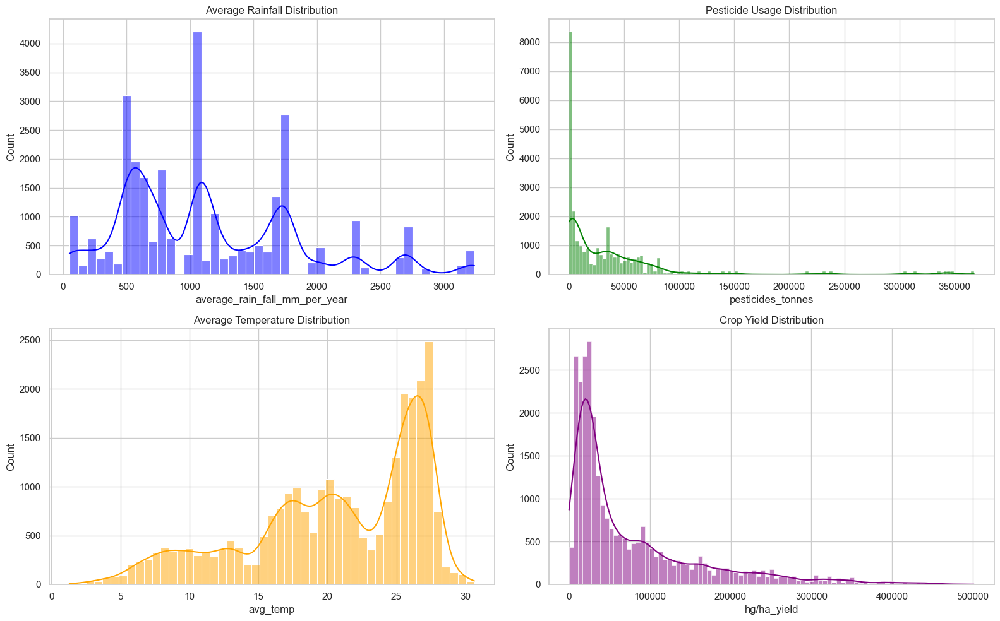

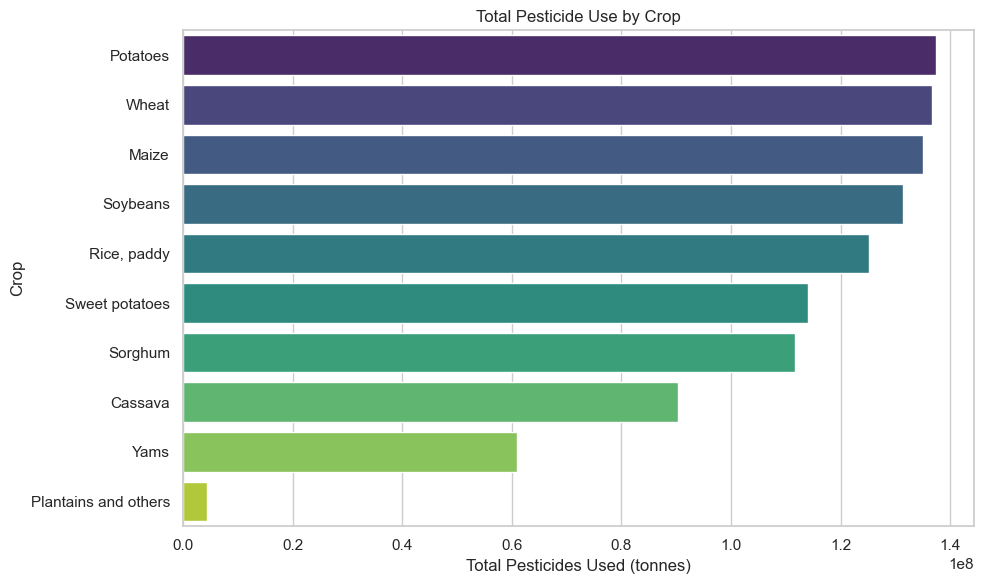

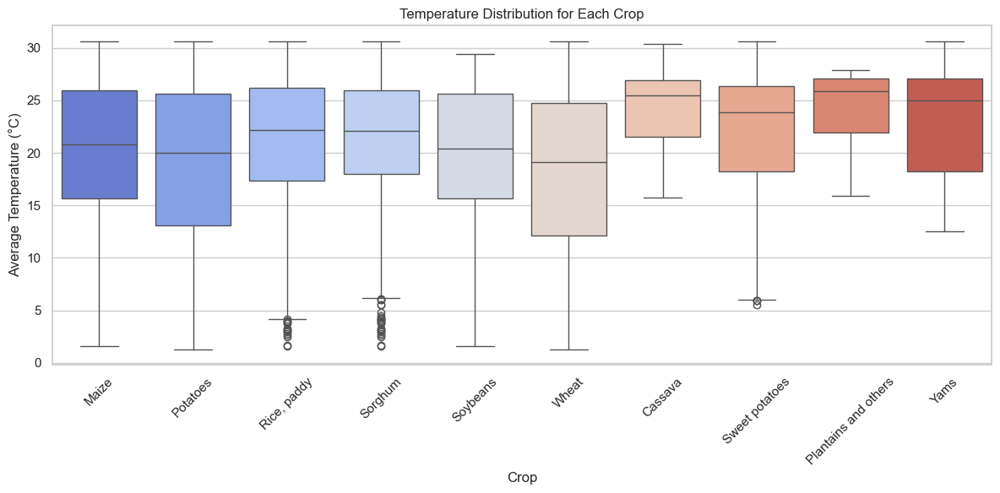

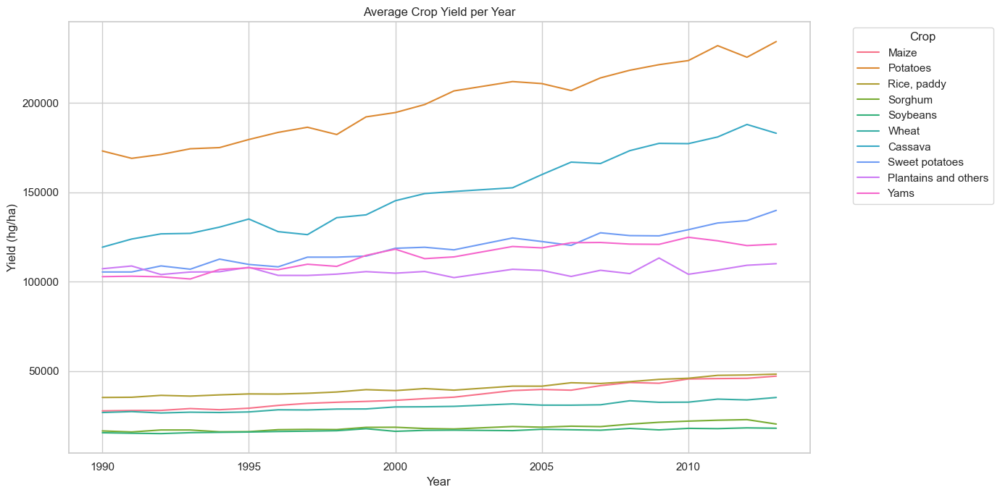

In [104]:
# Set seaborn style
sns.set(style='whitegrid', palette='Set2')

# 1. Scatterplot: Relationship between Rainfall and Pesticide Use
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='average_rain_fall_mm_per_year', y='pesticides_tonnes', hue='Crop', alpha=0.7)
plt.title('Rainfall vs Pesticide Use by Crop')
plt.xlabel('Average Rainfall (mm/year)')
plt.ylabel('Pesticide Use (tonnes)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# 2. KDE + Barplot for Rainfall, Pesticides, Temperature, and Yield
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
sns.histplot(df['average_rain_fall_mm_per_year'], kde=True, ax=axes[0, 0], color='blue')
axes[0, 0].set_title('Average Rainfall Distribution')
sns.histplot(df['pesticides_tonnes'], kde=True, ax=axes[0, 1], color='green')
axes[0, 1].set_title('Pesticide Usage Distribution')
sns.histplot(df['avg_temp'], kde=True, ax=axes[1, 0], color='orange')
axes[1, 0].set_title('Average Temperature Distribution')
sns.histplot(df['hg/ha_yield'], kde=True, ax=axes[1, 1], color='purple')
axes[1, 1].set_title('Crop Yield Distribution')
plt.tight_layout()
plt.show()

# 3. Bar Chart: Crops by Total Pesticide Used (Descending)
crop_pesticide = df.groupby('Crop')['pesticides_tonnes'].sum().sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=crop_pesticide.values, y=crop_pesticide.index, palette='viridis', hue=crop_pesticide.index)
plt.title('Total Pesticide Use by Crop')
plt.xlabel('Total Pesticides Used (tonnes)')
plt.ylabel('Crop')
plt.tight_layout()
plt.show()

# 4. Boxplot: Temperature Needed by Various Crops
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='Crop', y='avg_temp', palette='coolwarm', hue='Crop')
plt.title('Temperature Distribution for Each Crop')
plt.xlabel('Crop')
plt.ylabel('Average Temperature (°C)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 5. Line Plot: Average Yield per Year for Each Crop
plt.figure(figsize=(14, 7))
sns.lineplot(data=df, x='Year', y='hg/ha_yield', hue='Crop', estimator='mean', errorbar=None)
plt.title('Average Crop Yield per Year')
plt.xlabel('Year')
plt.ylabel('Yield (hg/ha)')
plt.legend(title='Crop', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [112]:
from sklearn.preprocessing import LabelEncoder
encoder= LabelEncoder()
categorical_column=['Area','Crop','Year']
def encoding(df,column):
    df[column]=encoder.fit_transform(df[column])
    return df
for column in categorical_column:
    df=encoding(df,column)
df.head()

,Area,Crop,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,0,1,0,36613,1485.0,121.0,16.37
1,0,3,0,66667,1485.0,121.0,16.37
2,0,4,0,23333,1485.0,121.0,16.37
3,0,5,0,12500,1485.0,121.0,16.37
4,0,6,0,7000,1485.0,121.0,16.37


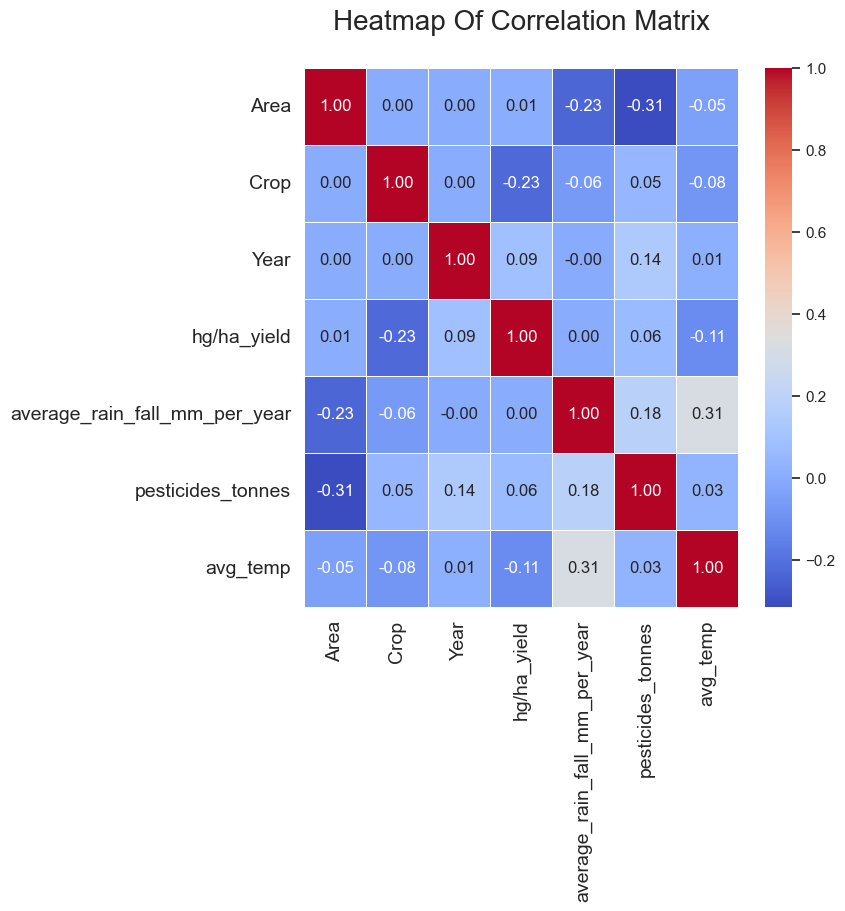

In [114]:
#obtaining the correlation between columns
correlation= df.corr()
#plot the correlation matrix
plt.figure(figsize=(7,7))
#plot a heatmap
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Heatmap Of Correlation Matrix\n', fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [116]:
X=df.drop('hg/ha_yield', axis=1)
Y=df['hg/ha_yield']

In [120]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
X=scaler.fit_transform(X)

In [122]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=50)

**KNeigbors Regression**

In [124]:
#create a function to train a K-Nearest-Neighbor model
def knn_(X_train,X_test,Y_train,Y_test):
    #call the K-Nearest-Neighbor model
    knn_reg=KNeighborsRegressor()
    #fit the model into the data set
    knn_reg=knn_reg.fit(X_train,Y_train)
    Y_actual=knn_reg.predict(X_train)
    mse_train=mean_squared_error(Y_train,Y_actual)
    r2_train=r2_score(Y_train,Y_actual)
    
    #Evaluate Accuracy on Test Data Set
    Y_pred=knn_reg.predict(X_test)
    mse_pred=mean_squared_error(Y_test,Y_pred)
    r2_pred=r2_score(Y_test,Y_pred)
    
    print(f"Mean Squared Error on trained data= {mse_train:.4f}")
    print(f"R-squared on trained data={r2_train:.4f}")

    print(f"Mean Squared Error on predicted data= {mse_pred:.4f}")
    print(f"R-squared on predicted data={r2_pred:.4f}\n")
    return 
print('MODEL EVALUATION')
knn_(X_train,X_test,Y_train,Y_test)

MODEL EVALUATION
Mean Squared Error on trained data= 269659319.7188
R-squared on trained data=0.9626
Mean Squared Error on predicted data= 537659545.3013
R-squared on predicted data=0.9260



In [126]:
#function to perform hyperparameter tuning for KNN
def grid_Knn(X_train,X_test,Y_train,Y_test):
    #call the model
    knn_reg=KNeighborsRegressor()
    #perform hyperparamter tunning for knn
    param_grid=[{'n_neighbors':(range(1,20)),'weights':['uniform'],'metric':['euclidean']},
                {'n_neighbors':(range(1,20)),'weights':['distance'],'metric':['manhattan']}]
    #fit hyperparameter into gridsearch to automatically tune
    gs=GridSearchCV(knn_reg,param_grid,scoring='r2',cv=10,error_score='raise',n_jobs=-1)
    #fit into the data set
    gs=gs.fit(X_train,Y_train)
    knn_best=gs.best_estimator_
    #get the best parameters
    best_params=knn_best.get_params()
    best_k_value=best_params['n_neighbors']
    best_weight=best_params['weights']
    best_metric=best_params['metric']
    print(f"BEST KNN MODEL PARAMETER: K= {best_k_value}, WEIGHT= {best_weight}, METRIC= { best_metric}")

#call the function    
grid_Knn(X_train,X_test,Y_train,Y_test)

BEST KNN MODEL PARAMETER: K= 1, WEIGHT= uniform, METRIC= euclidean


In [127]:
#call the K-Nearest-Neighbor model and fit in the best parameters
knn=KNeighborsRegressor(n_neighbors=1,weights='uniform',metric='euclidean')
#fit the model into the data set
knn=knn.fit(X_train,Y_train)
Y_actual=knn.predict(X_train)
mse_train=mean_squared_error(Y_train,Y_actual)
r2_train=r2_score(Y_train,Y_actual)
    
#Evaluate Accuracy on Test Data Set
Y_pred=knn.predict(X_test)
mse_pred=mean_squared_error(Y_test,Y_pred)
r2_pred=r2_score(Y_test,Y_pred)

print(f"Mean Squared Error on trained data= {mse_train:.4f}")
print(f"R-squared on trained data={r2_train:.4f}\n")

print(f"Mean Squared Error on predicted data= {mse_pred:.4f}")
print(f"R-squared on predicted data={r2_pred:.4f}\n")

Mean Squared Error on trained data= 0.0000
R-squared on trained data=1.0000

Mean Squared Error on predicted data= 179934406.4634
R-squared on predicted data=0.9752



Training Performance:
  MSE:  0.0000
  MAE:  0.0000
  MAPE: 0.0000
  R2:   1.0000

Test Performance:
  MSE:  179934406.4634
  MAE:  3970.7831
  MAPE: 0.0792
  R2:   0.9752


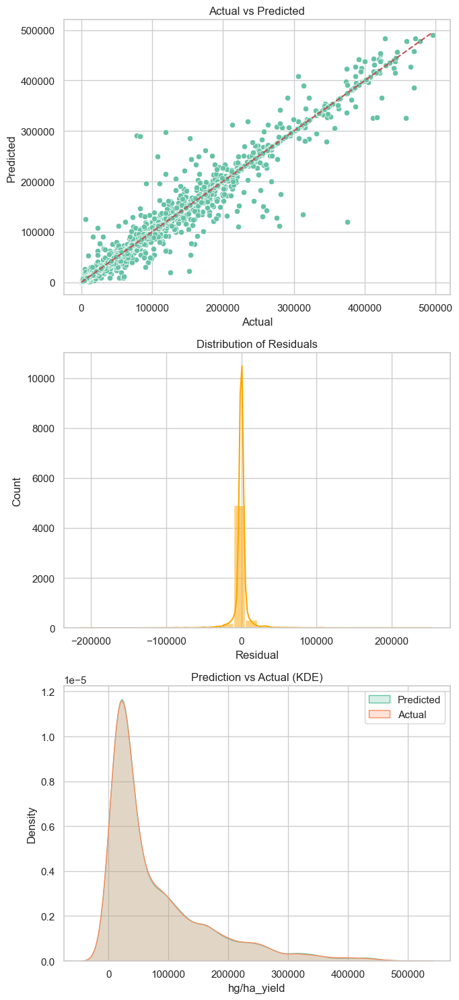

In [128]:
# Fit the KNN regressor with best parameters
knn = KNeighborsRegressor(n_neighbors=1, weights='uniform', metric='euclidean')
knn.fit(X_train, Y_train)

# Predict on training data
Y_actual = knn.predict(X_train)
mse_train = mean_squared_error(Y_train, Y_actual)
mae_train = mean_absolute_error(Y_train, Y_actual)
mape_train = mean_absolute_percentage_error(Y_train, Y_actual)
r2_train = r2_score(Y_train, Y_actual)

# Predict on test data
Y_pred = knn.predict(X_test)
mse_pred = mean_squared_error(Y_test, Y_pred)
mae_pred = mean_absolute_error(Y_test, Y_pred)
mape_pred = mean_absolute_percentage_error(Y_test, Y_pred)
r2_pred = r2_score(Y_test, Y_pred)

# Print metrics
print("Training Performance:")
print(f"  MSE:  {mse_train:.4f}")
print(f"  MAE:  {mae_train:.4f}")
print(f"  MAPE: {mape_train:.4f}")
print(f"  R2:   {r2_train:.4f}\n")

print("Test Performance:")
print(f"  MSE:  {mse_pred:.4f}")
print(f"  MAE:  {mae_pred:.4f}")
print(f"  MAPE: {mape_pred:.4f}")
print(f"  R2:   {r2_pred:.4f}")

# --- Visualization Section ---

plt.figure(figsize=(7, 15))

# 1. Actual vs Predicted
plt.subplot(3, 1, 1)
sns.scatterplot(x=Y_test, y=Y_pred)
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], 'r--')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')

# 2. Residuals Plot
plt.subplot(3, 1, 2)
residuals = Y_test - Y_pred
sns.histplot(residuals, bins=30, kde=True, color='orange')
plt.xlabel('Residual')
plt.title('Distribution of Residuals')

# 3. Prediction Error Distribution
plt.subplot(3, 1, 3)
sns.kdeplot(Y_pred, label='Predicted', fill=True)
sns.kdeplot(Y_test, label='Actual', fill=True)
plt.title('Prediction vs Actual (KDE)')
plt.legend()

plt.tight_layout()
plt.show()

**DECISION TREE FOR REGRESSION**

In [132]:
#call the DecisionTreeClassifier model 
dtc=DecisionTreeRegressor(random_state=7)
#fit the model into the data set
dtc=dtc.fit(X_train,Y_train)
#predict the train data set
Y_actual=dtc.predict(X_train)
#obtain the mean sqaure error
mse_train=mean_squared_error(Y_train,Y_actual)
r2_train=r2_score(Y_train,Y_actual)
    
#predict the train data set
Y_pred=dtc.predict(X_test)
#obtain the mean sqaure error
mse_pred=mean_squared_error(Y_test,Y_pred)
r2_pred=r2_score(Y_test,Y_pred)
print(f"Mean Squared Error on trained data= {mse_train:.4f}")
print(f"R-squared on trained data={r2_train:.4f}\n")

print(f"Mean Squared Error on predicted data= {mse_pred:.4f}")
print(f"R-squared on predicted data={r2_pred:.4f}\n")

Mean Squared Error on trained data= 0.0000
R-squared on trained data=1.0000

Mean Squared Error on predicted data= 185509793.6736
R-squared on predicted data=0.9745



In [134]:
#function to perfrom hyperparameter tuning for Decision Tree Classifier
def grid_dec(X_train,X_test,Y_reg_train,Y_reg_test):
    #call the model
    dtc=DecisionTreeRegressor(random_state=7)
    #perform hyperparamter tunning for Decision Tree Classifier
    param_grid=[{'max_depth':(range(1,20)),'splitter':['random'],'criterion':['squared_error']},
                {'max_depth':(range(1,20)),'splitter':['best'],'criterion':['absolute_error']}]
    #fit hyperparameter into gridsearch to automatically tune
    gs=GridSearchCV(dtc,param_grid,scoring='r2',cv=10,error_score='raise',n_jobs=-1)
    #fit into the data set
    gs=gs.fit(X_train,Y_train)
    dtc_best=gs.best_estimator_
    #get the best parameters
    best_params=dtc_best.get_params()
    best_max_depth=best_params['max_depth']
    best_criterion=best_params['criterion']
    best_splitter=best_params['splitter']
    print(f"BEST DECISION TREE MODEL PARAMETER:\nTree-Depth={best_max_depth},Splitter={best_splitter},Criterion={best_criterion}")

#call the hyperparameter function
grid_dec(X_train,X_test,Y_train,Y_test)

BEST DECISION TREE MODEL PARAMETER:
Tree-Depth=19,Splitter=random,Criterion=squared_error


PARAMETER TUNNING AND REGRESSION MODEL EVALUATION
Mean Square error on tuned DECISION TREE trained data= 16582325.8105
R-Squared on tuned DECISION TREE trained data= 0.9977

Mean Square error on tuned DECISION TREE predicted data= 183045416.2153
R-Squared on tuned DECISION TREE trained data= 0.9748


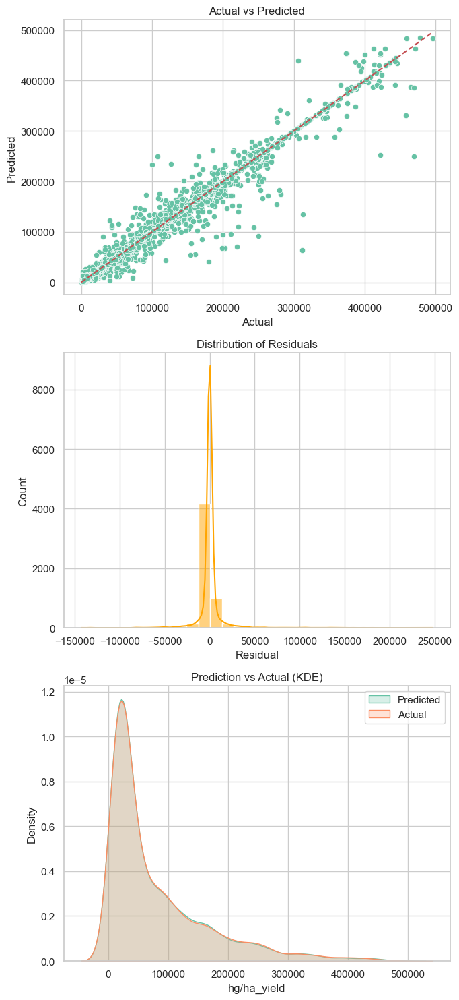

In [135]:
#call the DecisionTreeClassifier model and fit in the best parameters
dtc=DecisionTreeRegressor(max_depth=19,splitter='random',criterion='squared_error',random_state=7)
#fit the model into the data set
dtc=dtc.fit(X_train,Y_train)
#predict the train data set
Y_actual=dtc.predict(X_train)
#obtain the mean sqaure error
mse_train=mean_squared_error(Y_train,Y_actual)
r2_train=r2_score(Y_train,Y_actual)
    
#predict the train data set
Y_pred=dtc.predict(X_test)
#obtain the mean sqaure error
mse_pred=mean_squared_error(Y_test,Y_pred)
r2_pred=r2_score(Y_test,Y_pred)

print("PARAMETER TUNNING AND REGRESSION MODEL EVALUATION")
print(f"Mean Square error on tuned DECISION TREE trained data= {mse_train:.4f}")
print(f"R-Squared on tuned DECISION TREE trained data= {r2_train:.4f}\n")
print(f"Mean Square error on tuned DECISION TREE predicted data= {mse_pred:.4f}")
print(f"R-Squared on tuned DECISION TREE trained data= {r2_pred:.4f}")


plt.figure(figsize=(7, 15))

# 1. Actual vs Predicted
plt.subplot(3, 1, 1)
sns.scatterplot(x=Y_test, y=Y_pred)
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], 'r--')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')

# 2. Residuals Plot
plt.subplot(3, 1, 2)
residuals = Y_test - Y_pred
sns.histplot(residuals, bins=30, kde=True, color='orange')
plt.xlabel('Residual')
plt.title('Distribution of Residuals')

# 3. Prediction Error Distribution
plt.subplot(3, 1, 3)
sns.kdeplot(Y_pred, label='Predicted', fill=True)
sns.kdeplot(Y_test, label='Actual', fill=True)
plt.title('Prediction vs Actual (KDE)')
plt.legend()

plt.tight_layout()
plt.show()

**Linear Regression**

REGRESSION MODEL EVALUATION
Mean Squared Error on trained data= 6619940613.8206
R-squared on trained data=0.0814

Mean Squared Error on predicted data= 6624834168.7044
R-squared on predicted data=0.0876



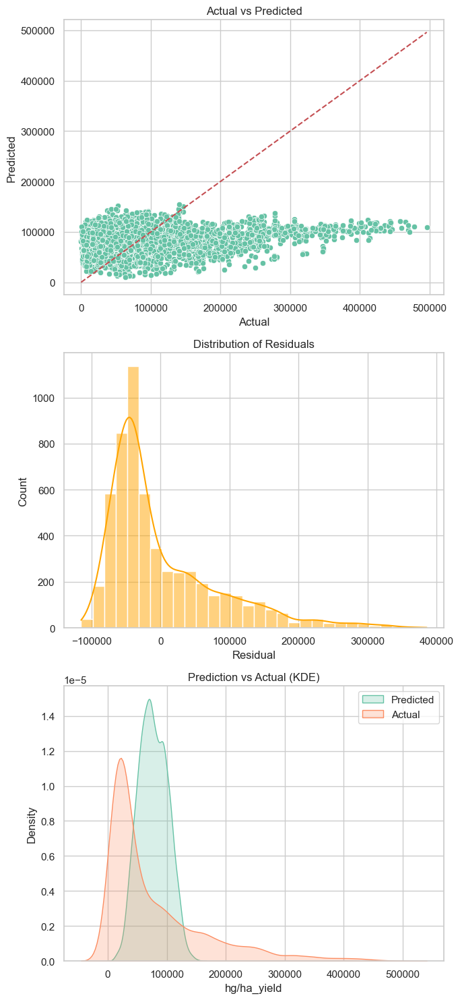

In [137]:
lin=LinearRegression()
#Evaluate Accuracy On Training Data Set
lin=lin.fit(X_train,Y_train)
Y_actual=lin.predict(X_train)
mse_train=mean_squared_error(Y_train,Y_actual)
r2_train=r2_score(Y_train,Y_actual)
    
#Evaluate Accuracy on Test Data Set
Y_pred=lin.predict(X_test)
mse_pred=mean_squared_error(Y_test,Y_pred)
r2_pred=r2_score(Y_test,Y_pred)

print('REGRESSION MODEL EVALUATION')
print(f"Mean Squared Error on trained data= {mse_train:.4f}")
print(f"R-squared on trained data={r2_train:.4f}\n")

print(f"Mean Squared Error on predicted data= {mse_pred:.4f}")
print(f"R-squared on predicted data={r2_pred:.4f}\n")

plt.figure(figsize=(7, 15))

# 1. Actual vs Predicted
plt.subplot(3, 1, 1)
sns.scatterplot(x=Y_test, y=Y_pred)
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], 'r--')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')

# 2. Residuals Plot
plt.subplot(3, 1, 2)
residuals = Y_test - Y_pred
sns.histplot(residuals, bins=30, kde=True, color='orange')
plt.xlabel('Residual')
plt.title('Distribution of Residuals')

# 3. Prediction Error Distribution
plt.subplot(3, 1, 3)
sns.kdeplot(Y_pred, label='Predicted', fill=True)
sns.kdeplot(Y_test, label='Actual', fill=True)
plt.title('Prediction vs Actual (KDE)')
plt.legend()

plt.tight_layout()
plt.show()

# print(f"Model Coefficients\n{Lin.coef_}\n")
# print(f"Model Intercept={Lin.intercept_}")

**Random Forest Regressor**

RANDOM FOREST REGRESSION
Mean Square error on tuned DECISION TREE trained data= 13708866.7255
R-Squared on tuned DECISION TREE trained data= 0.9981

Mean Square error on tuned DECISION TREE predicted data= 94314790.5004
R-Squared on tuned DECISION TREE trained data= 0.9870


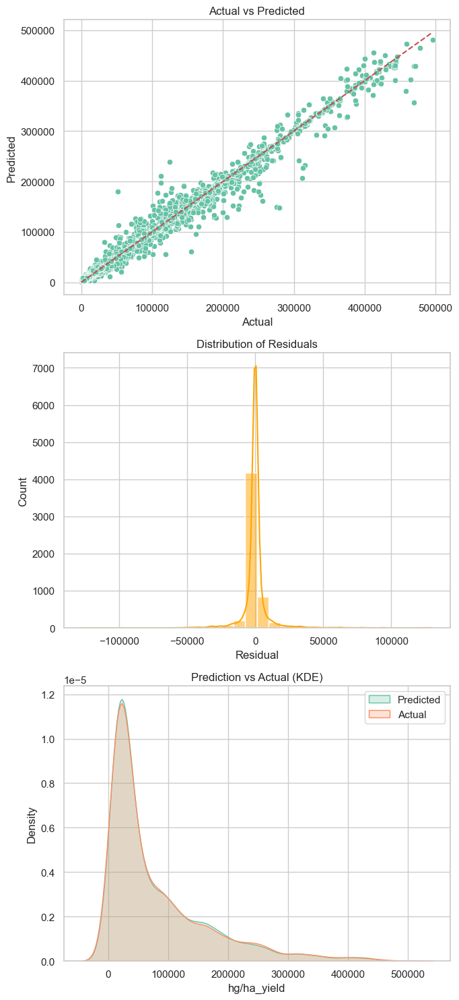

In [139]:
#call the random forest model
r_forest=RandomForestRegressor(random_state=10)
r_forest=r_forest.fit(X_train,Y_train)
#predict the train data set
Y_actual=r_forest.predict(X_train)
#obtain the mean sqaure error
mse_train=mean_squared_error(Y_train,Y_actual)
r2_train=r2_score(Y_train,Y_actual)
    
#predict the train data set
Y_pred=r_forest.predict(X_test)
#obtain the mean sqaure error
mse_pred=mean_squared_error(Y_test,Y_pred)
r2_pred=r2_score(Y_test,Y_pred)

print('RANDOM FOREST REGRESSION')
print(f"Mean Square error on tuned DECISION TREE trained data= {mse_train:.4f}")
print(f"R-Squared on tuned DECISION TREE trained data= {r2_train:.4f}\n")
print(f"Mean Square error on tuned DECISION TREE predicted data= {mse_pred:.4f}")
print(f"R-Squared on tuned DECISION TREE trained data= {r2_pred:.4f}")

plt.figure(figsize=(7, 15))

# 1. Actual vs Predicted
plt.subplot(3, 1, 1)
sns.scatterplot(x=Y_test, y=Y_pred)
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], 'r--')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')

# 2. Residuals Plot
plt.subplot(3, 1, 2)
residuals = Y_test - Y_pred
sns.histplot(residuals, bins=30, kde=True, color='orange')
plt.xlabel('Residual')
plt.title('Distribution of Residuals')

# 3. Prediction Error Distribution
plt.subplot(3, 1, 3)
sns.kdeplot(Y_pred, label='Predicted', fill=True)
sns.kdeplot(Y_test, label='Actual', fill=True)
plt.title('Prediction vs Actual (KDE)')
plt.legend()

plt.tight_layout()
plt.show()

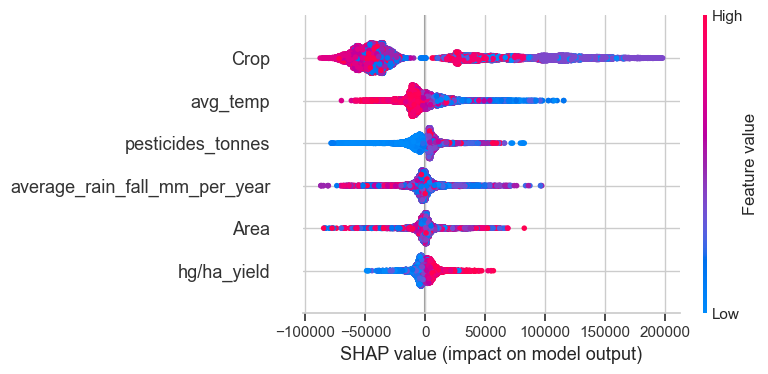

In [140]:
# Explainability
import shap
# SHAP Explainability
explainer = shap.Explainer(dtc)
shap_values = explainer(X)

# Plot
shap.summary_plot(shap_values, X, feature_names=df.drop(columns=['Year']).columns)